# OCR in Videos

## Importing Libraries

In [1]:
import cv2
import imutils
import numpy as np
import matplotlib.pyplot as plt
from imutils.object_detection import non_max_suppression
from PIL import Image, ImageDraw, ImageFont

## Tesseract

In [2]:
import pytesseract

config_tesseract = "--tessdata-dir tessdata --psm 7"

In [3]:
def tesseract_OCR(img, config_tesseract):
    text = pytesseract.image_to_string(img, lang='por', config=config_tesseract)
    return text

### Preprocessing

In [4]:
def preprocessing(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    resized = cv2.resize(gray, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
    value, otsu = cv2.threshold(resized, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
    return otsu

## EAST

In [5]:
detector = 'Sources/Models/frozen_east_text_detection.pb'
height_EAST, width_EAST = 640, 640

In [6]:
min_conf_EAST = 0.9

In [7]:
layers_EAST = [
    "feature_fusion/Conv_7/Sigmoid",
    "feature_fusion/concat_3"
]

### Functions - EAST

In [8]:
def geometric_data(geo, y):
    x_data_0 = geo[0, 0, y]
    x_data_1 = geo[0, 1, y]
    x_data_2 = geo[0, 2, y]
    x_data_3 = geo[0, 3, y]
    angles_data = geo[0, 4, y]
    return angles_data, x_data_0, x_data_1, x_data_2, x_data_3
    

In [9]:
def geometric_calculation(angles_data, x_data_0, x_data_1, x_data_2, x_data_3, x, y):
    (offset_x, offset_y) = (x * 4.0, y * 4.0)
    angle = angles_data[x]
    cos = np.cos(angle)
    sin = np.sin(angle)
    h = x_data_0[x] + x_data_2[x]
    w = x_data_1[x] + x_data_3[x]
    
    end_x = int(offset_x + (cos * x_data_1[x]) + (sin * x_data_2[x]))
    end_y = int(offset_y - (sin * x_data_1[x]) + (cos * x_data_2[x]))
    
    begin_x = int(end_x - w)
    begin_y = int(end_y - h)
    
    return begin_x, begin_y, end_x, end_y

### Function preprocess

In [10]:
def east_preprocessing(img, width, height, network, layer_names, min_confidence):
    original = img.copy()
    (H, W) = img.shape[:2]
    proportion_w = W  / float(width)
    proportion_h = H / float(height)
    img = cv2.resize(img, ( width, height ))
    (H, W) = img.shape[:2]
    
    blob = cv2.dnn.blobFromImage(img, 1.0, (W, H), swapRB=True, crop=False)
    
    network.setInput(blob)
    (scores, geometry) = network.forward(layer_names)
    (rows, columns) = scores.shape[2:4]
    
    boxes = []
    confidences = []
    for y in range(0, rows):
        data_scores = scores[0, 0, y]
        data_angles, x0_data, x1_data, x2_data, x3_data = geometric_data(geometry, y)
        
        for x in range(0, columns):
            if data_scores[x] < min_confidence:
                continue
            
            begin_x, begin_y, end_x, end_y = geometric_calculation(data_angles, x0_data, x1_data, x2_data, x3_data, x, y)
            confidences.append(data_scores[x])
            boxes.append((begin_x, begin_y, end_x, end_y))
            
    return proportion_w, proportion_h, confidences, boxes

    

## Function to write on the video

In [11]:
font = 'Sources/Fonts/calibri.ttf'

In [12]:
def write_text(text, x, y, img, font, color=(50, 50, 255), font_size=22):
    font = ImageFont.truetype(font, font_size)
    img_pil = Image.fromarray(img)
    draw = ImageDraw.Draw(img_pil)
    draw.text((x, y-font_size), text, fill=color, font=font)
    img = np.array(img_pil)
    return img

In [13]:
def text_background(text, x, y, img, font, font_size=32, color=(200, 255, 0)):
    background = np.full(img.shape, (0, 0, 0), dtype=np.uint8)
    text_back = write_text(text, x, y, background, font, (255, 255, 255), font_size=font_size)
    fx, fy, fw, fh = cv2.boundingRect(text_back[:, :, 2])
    cv2.rectangle(img, (fx, fy), (fx+fw, fy+fh), color, -1)
    return img

## Loading EAST

In [14]:
EAST_net = cv2.dnn.readNet(detector)

## Loading video file

In [15]:
video_file = 'Sources/Videos/test02.mp4'
capture = cv2.VideoCapture(video_file)
connected, video = capture.read()

In [16]:
connected, video

(True,
 array([[[172, 110,  77],
         [172, 110,  77],
         [172, 110,  77],
         ...,
         [201, 208, 207],
         [198, 209, 207],
         [198, 209, 207]],
 
        [[172, 110,  77],
         [172, 110,  77],
         [172, 110,  77],
         ...,
         [201, 208, 207],
         [198, 209, 207],
         [198, 209, 207]],
 
        [[173, 111,  79],
         [173, 111,  79],
         [173, 111,  79],
         ...,
         [201, 208, 207],
         [198, 209, 207],
         [198, 209, 207]],
 
        ...,
 
        [[100, 101,  98],
         [100, 101,  98],
         [100, 101,  98],
         ...,
         [ 94,  98, 104],
         [ 94,  98, 104],
         [ 94,  98, 104]],
 
        [[100, 101,  98],
         [100, 101,  98],
         [100, 101,  98],
         ...,
         [ 34,  39,  45],
         [ 34,  39,  45],
         [ 35,  40,  46]],
 
        [[100, 101,  98],
         [100, 101,  98],
         [100, 101,  98],
         ...,
         [ 22,  26,  

In [17]:
video.shape

(720, 1284, 3)

In [18]:
video_width, video_height = video.shape[1], video.shape[0]
video_width, video_height

(1284, 720)

## Resizing Video

In [19]:
def resize_video(width, height, max_width = 600):
    if width > max_width:
        proportion = width/ height
        video_width = max_width
        video_height = int(video_width / proportion)
    else:
        video_width = width
        video_height = height
    return video_width, video_height

In [20]:
video_width, video_height = resize_video(video.shape[1], video.shape[0], 800)
video_width, video_height

(800, 448)

In [21]:
1278/720

1.775

In [22]:
800 / 1.78

449.438202247191

## Video Settings

In [23]:
name_video_file = 'result_east_tesseract.avi'
fourcc = cv2.VideoWriter_fourcc(*'XVID')
fps = 24
output_video = cv2.VideoWriter(name_video_file, fourcc, fps, (video_width, video_height))

## Processing Video

In [24]:
def cv2_imshow(img, gray=True):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.grid(False)
    plt.axis(False)
    if gray:
        plt.imshow(img, cmap='gray')
    else:
        plt.imshow(img)
    plt.show()

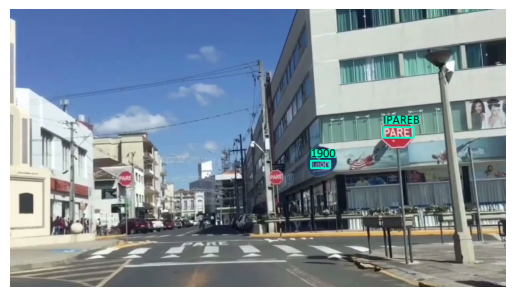

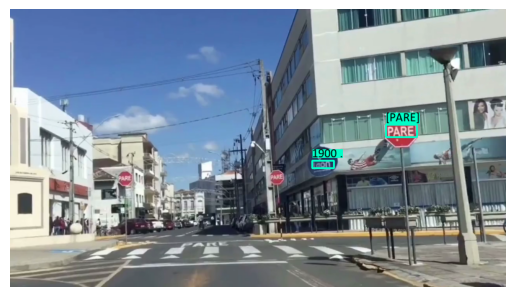

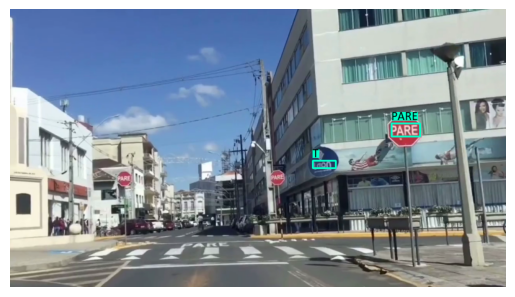

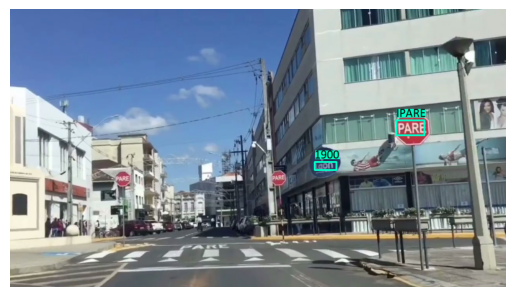

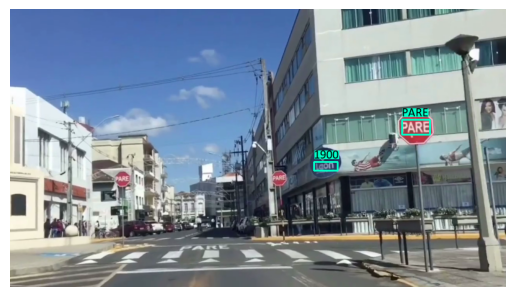

...

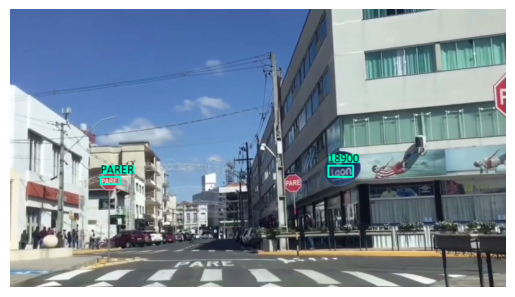

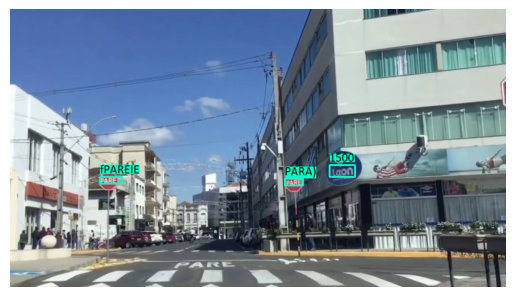

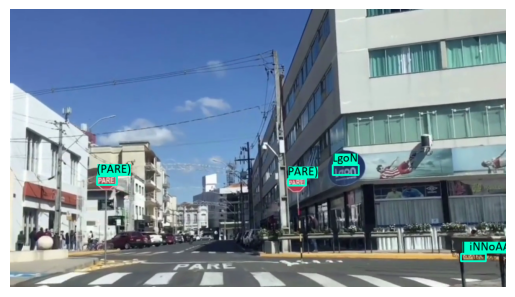

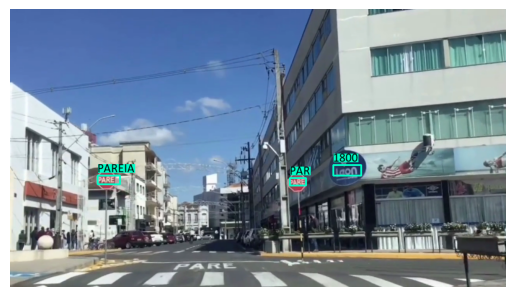

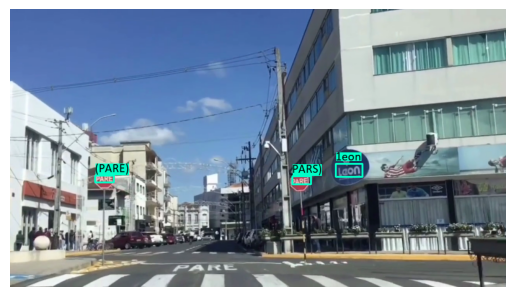

Finished!


In [25]:
show_frames = 20
current_frame = 0
margin = 4

while cv2.waitKey(1) < 0:
    connected, frame = capture.read()
    
    if not connected:
        break
    
    frame = cv2.resize(frame, (video_width, video_height))
    
    image_cp = frame.copy()
    proportion_w, proportion_h, confidences, boxes = east_preprocessing(frame, width_EAST, height_EAST, EAST_net, layers_EAST, min_conf_EAST)
    detections = non_max_suppression(np.array(boxes), probs=confidences)
    for (begin_x, begin_y, end_x, end_y) in detections: 
        begin_x = int(begin_x * proportion_w)
        begin_y = int(begin_y * proportion_h)
        end_x = int(end_x * proportion_w)
        end_y = int(end_y * proportion_h)
        if begin_x < margin:
            begin_x = margin
        if begin_y < margin:
            begin_y = margin

        (H, W) = image_cp.shape[:2]
        if end_x > W - margin:
            end_x = W - 1 - margin
        if end_y > H - margin:
            end_y = H - 1 - margin
                    
        
        cv2.rectangle(frame, (begin_x, begin_y), (end_x, end_y), (200, 255, 0), 2)
        roi = image_cp[begin_y - margin:end_y + margin, begin_x - margin:end_x + margin]
        processed_img = preprocessing(roi)
        text = tesseract_OCR(processed_img, config_tesseract)
        text = ''.join([c if ord(c) < 128 else '' for c in text]).strip()
        frame = text_background(text, begin_x, begin_y, frame, font, 20, (200, 255, 0))
        frame = write_text(text, begin_x, begin_y, frame, font, (0, 0, 0), 20)

    if current_frame <= show_frames:
        cv2_imshow(frame)
        current_frame += 1
        
    output_video.write(frame)

print('Finished!')
output_video.release()
cv2.destroyAllWindows()

## OCR Videos with EasyOCR

In [26]:
from easyocr import Reader
import cv2
from PIL import ImageFont, ImageDraw, Image
import numpy as np

In [27]:
languages_list = ['en', 'pt']
gpu = False
font = 'Sources/Fonts/calibri.ttf'

In [28]:
video_file = 'Sources/Videos/test02.mp4'
cap = cv2.VideoCapture(video_file)

connected, video = cap.read()
video_width, video_height = video.shape[1], video.shape[0]

In [29]:
video_width, video_height = resize_video(video.shape[1], video.shape[0], 800)
video_width, video_height

(800, 448)

In [30]:
def box_coordinates(box):
    (lt, rt, br, bl) = box
    lt = (int(lt[0]), int(lt[1]))
    rt = (int(rt[0]), int(rt[1]))
    br = (int(br[0]), int(br[1]))
    bl = (int(bl[0]), int(bl[1]))
    
    return lt, rt, br, bl

In [31]:
def draw_img(img, lt, br, color=(200, 255, 0), thickness=2):
    cv2.rectangle(img, lt, br, color, thickness)
    return img


In [32]:
name_video_file = 'result_easy_ocr.avi'
fourcc = cv2.VideoWriter_fourcc(*'XVID')
fps = 24
output_video = cv2.VideoWriter(name_video_file, fourcc, fps, (video_width, video_height))

Using CPU. Note: This module is much faster with a GPU.


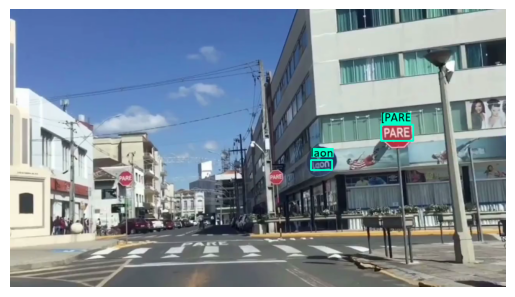

Using CPU. Note: This module is much faster with a GPU.


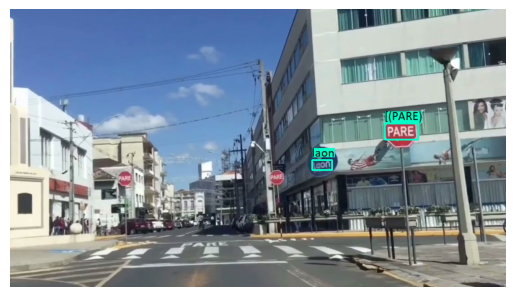

Using CPU. Note: This module is much faster with a GPU.


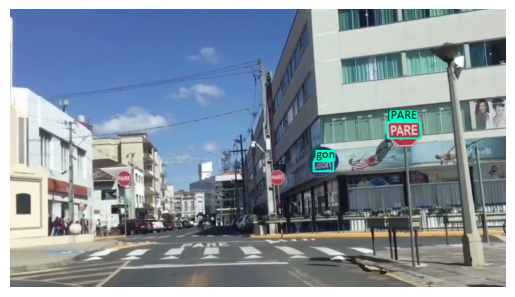

Using CPU. Note: This module is much faster with a GPU.


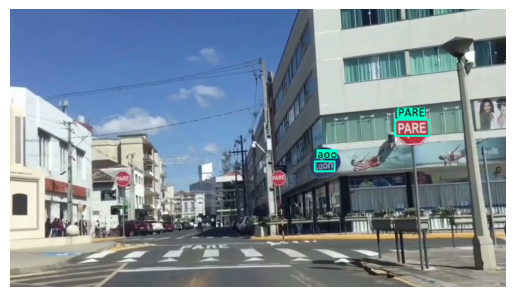

Using CPU. Note: This module is much faster with a GPU.


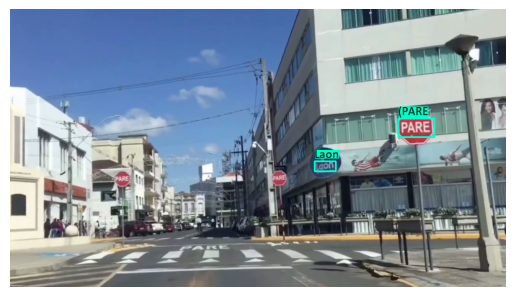

Using CPU. Note: This module is much faster with a GPU.


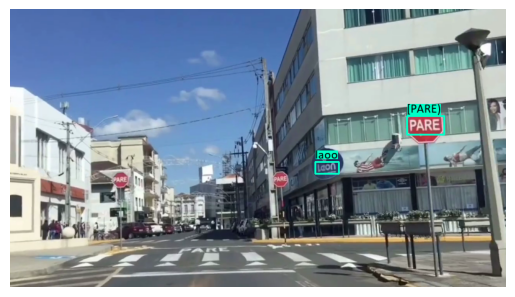

Using CPU. Note: This module is much faster with a GPU.


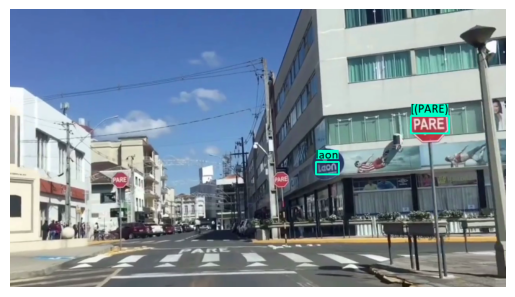

Using CPU. Note: This module is much faster with a GPU.


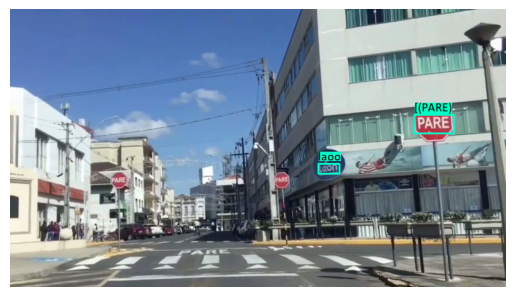

Using CPU. Note: This module is much faster with a GPU.


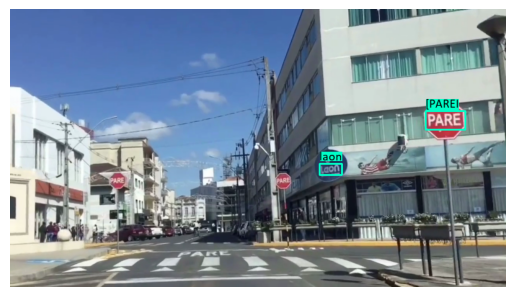

Using CPU. Note: This module is much faster with a GPU.


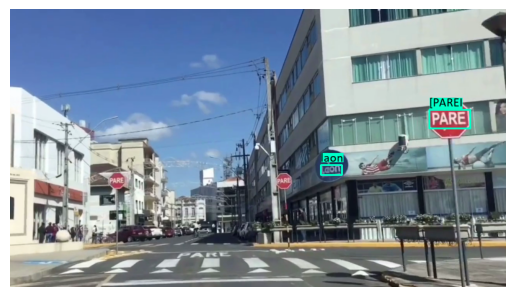

Using CPU. Note: This module is much faster with a GPU.


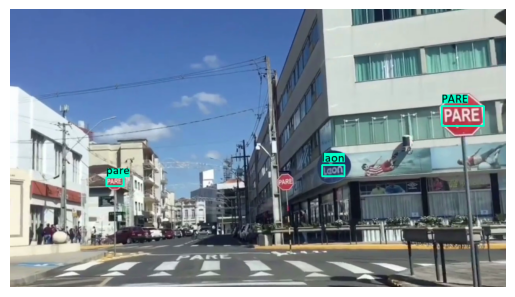

Using CPU. Note: This module is much faster with a GPU.


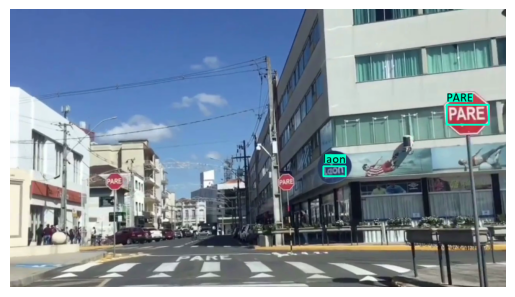

Using CPU. Note: This module is much faster with a GPU.


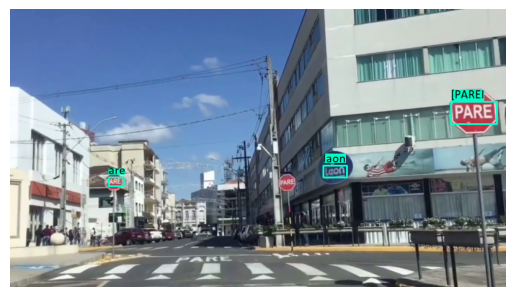

Using CPU. Note: This module is much faster with a GPU.


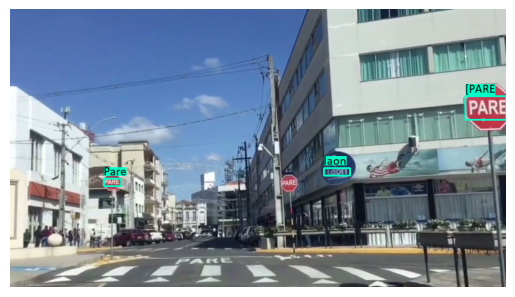

Using CPU. Note: This module is much faster with a GPU.


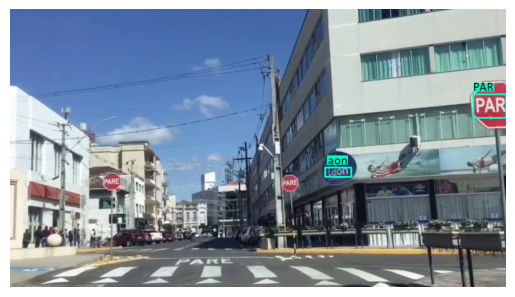

Using CPU. Note: This module is much faster with a GPU.


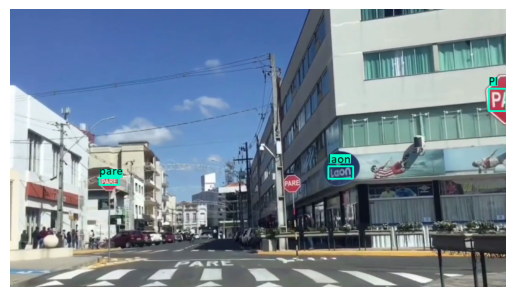

Using CPU. Note: This module is much faster with a GPU.


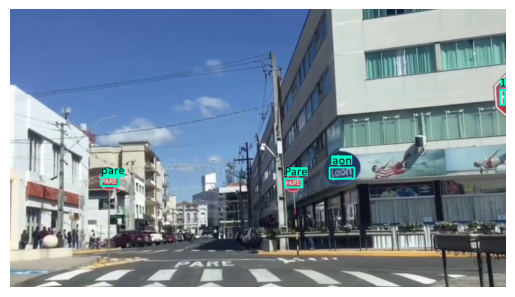

Using CPU. Note: This module is much faster with a GPU.


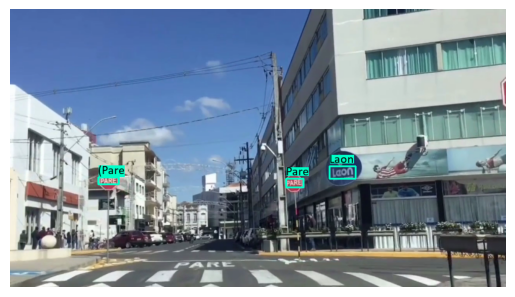

Using CPU. Note: This module is much faster with a GPU.


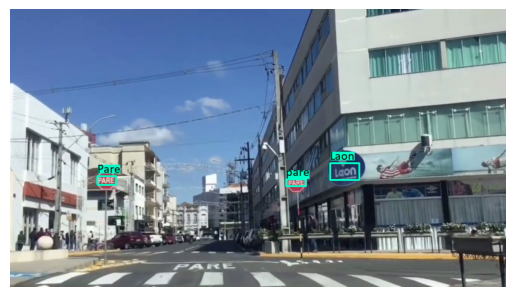

Using CPU. Note: This module is much faster with a GPU.


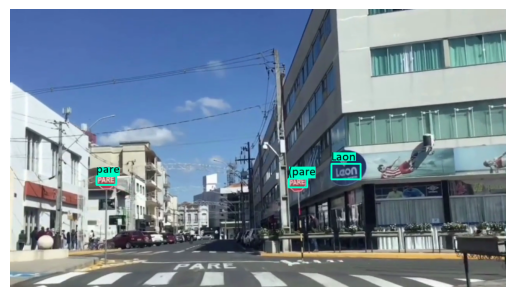

Using CPU. Note: This module is much faster with a GPU.


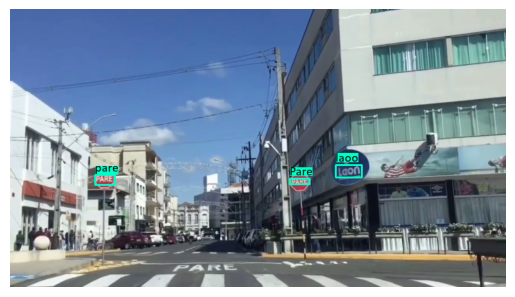

Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with a GPU.
Using CPU. Note: This module is much faster with

Break
Finished!


In [33]:
show_frames = 20
current_frame = 0
margin = 4

while cv2.waitKey(1) < 0:
    connected, frame = cap.read()
    
    if not connected:
        print('Break')
        break
        
    frame = cv2.resize(frame, (video_width, video_height))
    image_cp = frame.copy()
    reader = Reader(languages_list, gpu=gpu)
    results = reader.readtext(frame)
    for(box, text, prob) in results:
        lt, rt, br, bl = box_coordinates(box)
        frame = draw_img(frame, lt, br)
        frame = text_background(text, lt[0], lt[1], frame, font, 20, (200, 255, 0))
        frame = write_text(text, lt[0], lt[1], frame, font, (0, 0, 0), 20)
        
    if current_frame <= show_frames:
        cv2_imshow(frame)
        current_frame += 1
    
    output_video.write(frame)

print('Finished!')
output_video.release()
cv2.destroyAllWindows()